# Model Testing – Clustering Algorithm Comparison

This notebook explores and benchmarks several clustering approaches on our customer dataset, including:

1. **K-Means** over different feature subsets  
2. **DBSCAN** for density-based segmentation  
3. **Agglomerative (hierarchical) clustering** for comparison  

The goal is to identify which algorithm and feature combination produces the most coherent, stable, and actionable customer segments.

## 1. Set-up Environment and Load Data

In [3]:
# Libraries
import warnings
import os
import time as time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Set-up environment
pd.options.display.float_format = '{:.2f}'.format
pd.set_option('display.max_colwidth', None)
os.chdir('/Users/nataschajademinnitt/Documents/5. Data Analysis/segmenting_customers/')
print("Current directory:", os.getcwd())
warnings.filterwarnings("ignore")

Current directory: /Users/nataschajademinnitt/Documents/5. Data Analysis/segmenting_customers


In [4]:
# Load the data
df = pd.read_csv("./data/processed/processed_database.csv")
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64802 entries, 0 to 64801
Data columns (total 12 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_unique_id        64802 non-null  object 
 1   order_purchase_timestamp  64802 non-null  object 
 2   recency                   64802 non-null  int64  
 3   f_returning               64802 non-null  int64  
 4   m_price                   64802 non-null  float64
 5   m_price_log               64802 non-null  float64
 6   m_purchasing_power        64802 non-null  int64  
 7   state_spending            64802 non-null  float64
 8   m_total_installments      64802 non-null  float64
 9   product_score             64802 non-null  float64
 10  s_review_score            64802 non-null  float64
 11  s_delivery_diff           64802 non-null  float64
dtypes: float64(7), int64(3), object(2)
memory usage: 5.9+ MB


In [5]:
all_features = ['recency', 'f_returning',
                'm_price_log', 'm_purchasing_power', 'm_total_installments', 
                'product_score', 's_review_score', 's_delivery_diff']
df[all_features].describe()

,recency,f_returning,m_price_log,m_purchasing_power,m_total_installments,product_score,s_review_score,s_delivery_diff
count,64802.00,64802.00,64802.00,64802.00,64802.00,64802.00,64802.00,64802.00
mean,156.17,0.03,4.49,0.54,2.97,3.30,4.10,-10.20
std,98.99,0.16,0.92,0.50,2.72,1.41,1.31,9.63
min,0.00,0.00,0.62,0.00,0.00,-0.42,1.00,-146.02
25%,72.00,0.00,3.89,0.00,1.00,2.26,4.00,-15.19
50%,144.00,0.00,4.50,1.00,2.00,2.90,5.00,-11.21
75%,231.00,0.00,5.03,1.00,4.00,4.43,5.00,-6.30
max,364.00,1.00,9.51,1.00,26.00,5.41,5.00,188.98


## 2. Functions

In [7]:
def evaluate_k_metrics(
    df,
    features,
    k_min=2,
    k_max=10,
    random_state=42,
    save_fig=False,
    fig_path="./plots/tests/elbow_kmeans.png"
):
    """
    1) Scale features.
    2) Compute silhouette, Calinski-Harabasz, and Davies-Bouldin scores for k.
    3) Plot distortion elbow visualizer.
    """
    # Scale data
    X = df[features].values
    scaler = StandardScaler().fit(X)
    Xs = scaler.transform(X)

    # Metrics table
    metrics = []
    for k in range(k_min, k_max + 1):
        km = KMeans(n_clusters=k, random_state=random_state).fit(Xs)
        labels = km.labels_
        metrics.append({
            'k': k,
            'silhouette': silhouette_score(Xs, labels),
            'calinski_harabasz': calinski_harabasz_score(Xs, labels),
            'davies_bouldin': davies_bouldin_score(Xs, labels)
        })
    df_metrics = pd.DataFrame(metrics).set_index('k')
    print("Clustering metrics:\n", df_metrics)

    # Elbow visualizer
    fig, ax = plt.subplots(figsize=(6, 4))
    kelbow = KElbowVisualizer(
        KMeans(random_state=random_state),
        k=(k_min, k_max),
        metric='distortion',
        ax=ax
    )
    kelbow.fit(Xs)
    kelbow.finalize()
    best_k = kelbow.elbow_value_

    plt.tight_layout()
    if save_fig:
        os.makedirs(os.path.dirname(fig_path), exist_ok=True)
        fig.savefig(fig_path, dpi=150)
    plt.show()

    return scaler, df_metrics, best_k

In [8]:
def fit_best_k(
    df,
    features,
    scaler,
    k,
    features_interpret=None,
    random_state=42,
    save_fig=False,
    fig_path="./plots/tests/silhouette_kmeans.png"
):
    """
    1) Fit KMeans(k) on scaled features.
    2) Plot silhouette.
    3) Assign df['cluster'], print counts & mean profiles.
    """
    # Fit KMeans
    Xs = scaler.transform(df[features].values)
    km = KMeans(n_clusters=k, random_state=random_state).fit(Xs)
    df['cluster'] = km.labels_

    # Silhouete plot
    fig, ax = plt.subplots(figsize=(8,6))
    silvis = SilhouetteVisualizer(km, ax=ax)
    silvis.fit(Xs); silvis.finalize()
    plt.tight_layout()
    if save_fig:
        os.makedirs(os.path.dirname(fig_path), exist_ok=True)
        fig.savefig(fig_path, dpi=150)
    plt.show()

    # Assign 'cluster'
    counts = df['cluster'].value_counts().sort_index()
    print("Cluster counts:\n", counts.to_frame(name='count'))
    if features_interpret is None:
        features_interpret = features
    profiles = df.groupby('cluster')[features_interpret].mean().round(2)
    print("Cluster profiles:\n")
    display(profiles)

    return km, profiles

In [9]:
def visualise_clusters(
    df,
    features,
    scaler,
    km,
    subsample_size=10000,
    tsne_perplexity=40,
    random_state=42,
    save_fig=False,
    fig_dir="./plots/tests/tsne",
    cluster_col='cluster'
):
    """
    1) Randomly subsample df.
    2) Run t-SNE on scaled features.
    3) Plot t-SNE colored by cluster and by each feature in features.
    """
    
    if save_fig:
        os.makedirs(fig_dir, exist_ok=True)
        
    # Subsample
    idx = np.random.RandomState(random_state).choice(
        len(df), size=min(subsample_size, len(df)), replace=False
    )
    df_sub = df.iloc[idx].copy()
    
    # t-SNE embedding
    X_sub = scaler.transform(df_sub[features].values)
    tsne = TSNE(
        n_components=2,
        perplexity=tsne_perplexity,
        init='pca',
        random_state=random_state
    )
    Y = tsne.fit_transform(X_sub)
    df_sub['tsne1'], df_sub['tsne2'] = Y[:,0], Y[:,1]
    
    # Plot clusters
    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        data=df_sub, x='tsne1', y='tsne2',
        hue=cluster_col, palette='tab10',
        s=30, alpha=0.6
    )
    plt.title(f"t-SNE Visualization by Cluster (k={km.n_clusters})")
    plt.xlabel("t-SNE 1"); plt.ylabel("t-SNE 2")
    plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    if save_fig:
        plt.savefig(f"{fig_dir}/tsne_clusters_k{km.n_clusters}.png", dpi=150)
    plt.show()
    
    # Plot each feature
    for feat in features:
        plt.figure(figsize=(8,6))
        sc = plt.scatter(
            df_sub['tsne1'], df_sub['tsne2'],
            c=df_sub[feat], cmap='viridis',
            s=30, alpha=0.7
        )
        plt.title(f"t-SNE colored by {feat}")
        plt.xlabel("t-SNE 1"); plt.ylabel("t-SNE 2")
        plt.colorbar(sc, label=feat)
        plt.tight_layout()
        if save_fig:
            plt.savefig(f"{fig_dir}/tsne_{feat}.png", dpi=150)
        plt.show()
    
    return df_sub

## 3. K-Means Clustering

### Model 0: RFM

Clustering metrics:
    silhouette  calinski_harabasz  davies_bouldin
k                                               
2        0.73           33345.45            0.39
3        0.36           43806.63            0.88
4        0.37           53990.89            0.76
5        0.35           55722.29            0.81
6        0.35           56046.97            0.84
7        0.37           58093.57            0.74
8        0.36           57645.96            0.76


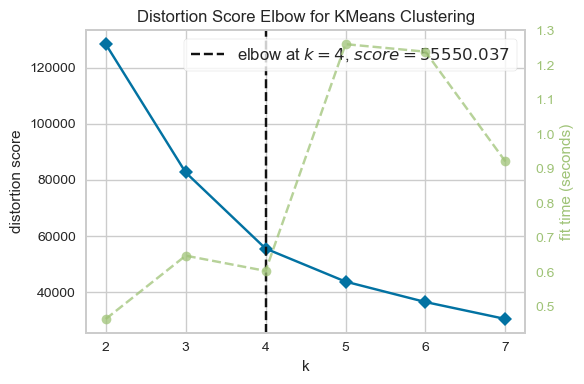

In [12]:
# 1) Evaluate cluster matrics
scaler, metrics, best_k = evaluate_k_metrics(
    df,
    features=['recency','f_returning','m_price_log'],
    k_min=2, k_max=8,
    save_fig=True,
    fig_path="./plots/tests/rfm/elbow_silhouette_rfm.png"
)

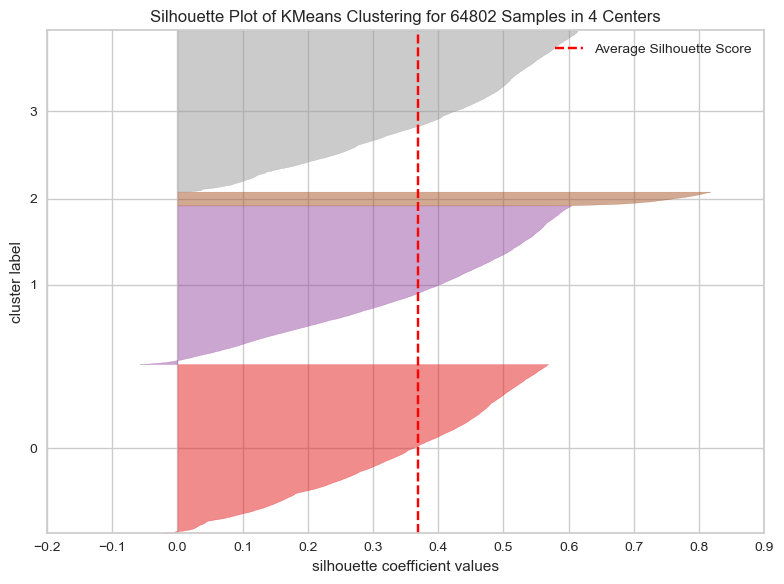

Cluster counts:
          count
cluster       
0        21759
1        20478
2         1766
3        20799
Cluster profiles:



,recency,f_returning,m_price
cluster,,,
0,101.60,0.00,251.64
1,271.88,0.00,109.21
2,142.50,1.00,253.94
3,100.50,0.00,43.78


In [13]:
# 2) Fit at chosen k, get profiles
km_model, cluster_profiles = fit_best_k(
    df,
    features=['recency','f_returning','m_price_log'],
    scaler=scaler,
    k=best_k,
    features_interpret=['recency','f_returning','m_price'],
    save_fig=True,
    fig_path="./plots/tests/rfm/silhouette_kmeans_RFM.png"
)

Clustering profiles 

0. New, high spenders
2. Dormant, moderate spenders
3. Returners, high spenders
4. New, low spenders

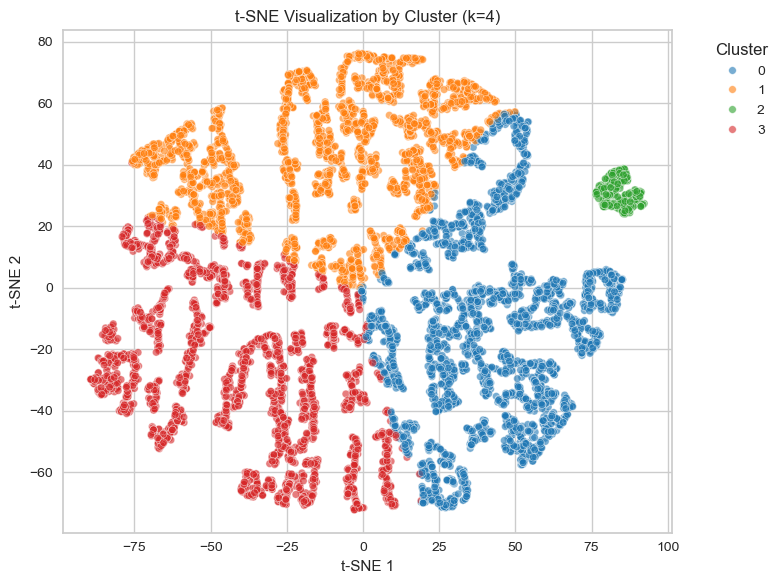

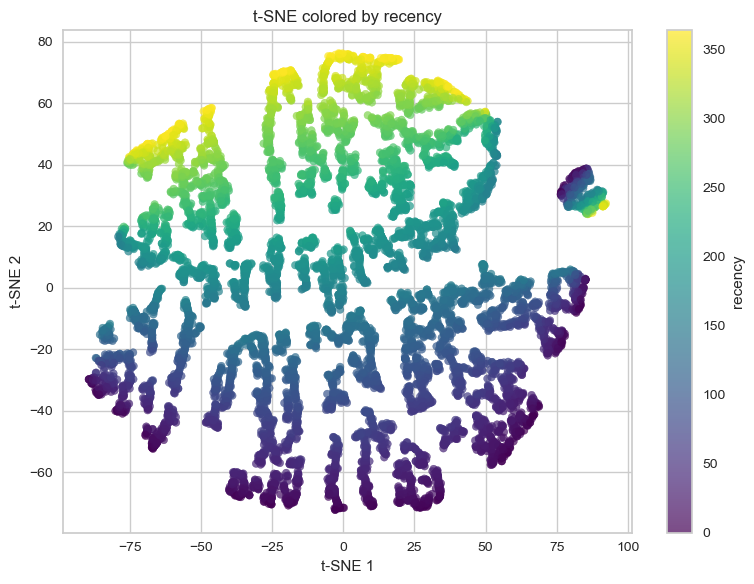

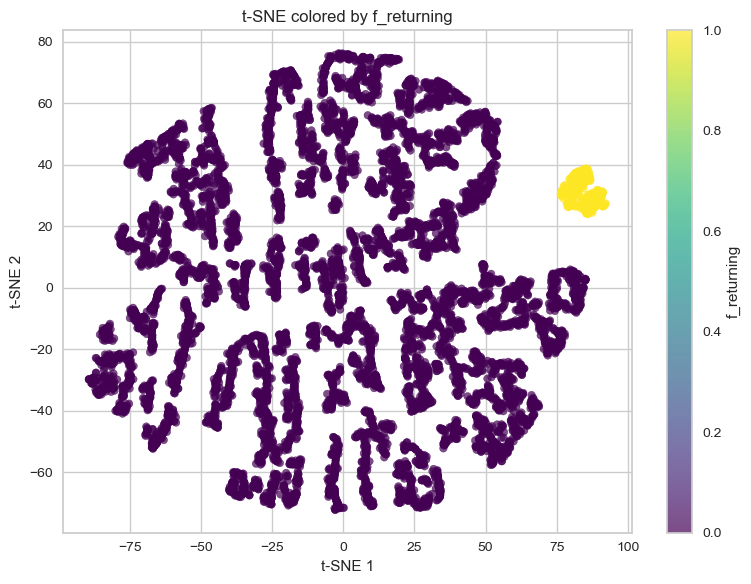

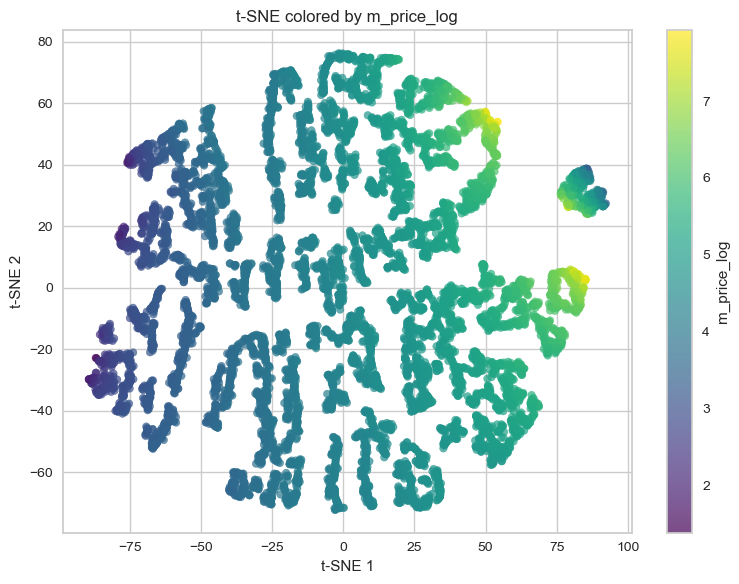

In [15]:
# 3) t-SNE visualization
df_sub = visualise_clusters(
    df,
    features=['recency','f_returning','m_price_log'],
    scaler=scaler,
    km=km_model,
    subsample_size=10000,
    tsne_perplexity=40,
    save_fig=True,
    fig_dir="./plots/tests/rfm"
)

### Model 1: RFM + review score

Clustering metrics:
    silhouette  calinski_harabasz  davies_bouldin
k                                               
2        0.66           22159.70            0.49
3        0.35           26822.08            1.01
4        0.33           32779.39            0.97
5        0.32           35840.32            0.89
6        0.30           34881.29            0.94
7        0.29           32853.29            1.00
8        0.28           31846.51            1.10


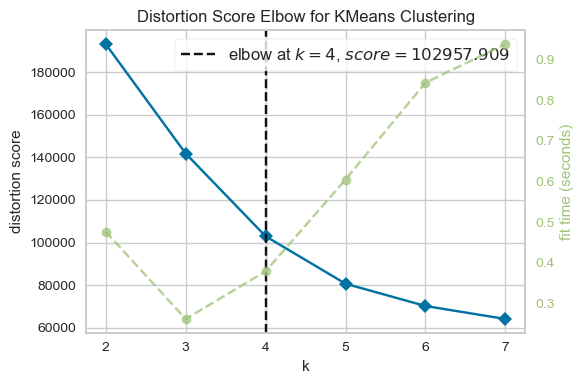

In [17]:
# 1) Evaluate cluster matrics
scaler, metrics, best_k = evaluate_k_metrics(
    df,
    features=['recency','f_returning','m_price_log', 's_review_score'],
    k_min=2, k_max=8,
    save_fig=True,
    fig_path="./plots/tests/rfm_review/elbow_silhouette_rfm_review.png"
)

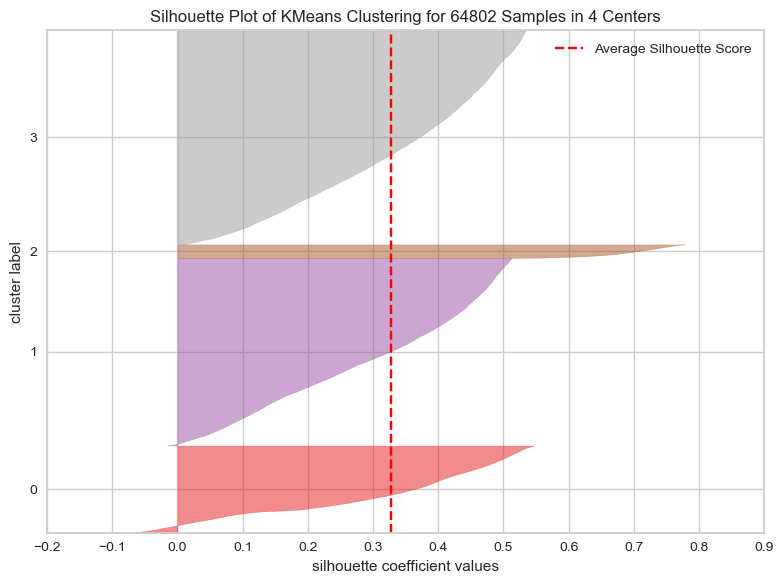

Cluster counts:
          count
cluster       
0        11244
1        24184
2         1766
3        27608
Cluster profiles:



,recency,f_returning,m_price,s_review_score
cluster,,,,
0,144.39,0.00,164.16,1.62
1,252.89,0.00,135.22,4.63
2,142.50,1.00,253.94,4.15
3,77.12,0.00,127.01,4.64


In [18]:
# 2) Fit at chosen k, get profiles
km_model, cluster_profiles = fit_best_k(
    df,
    features=['recency','f_returning','m_price_log', 's_review_score'],
    scaler=scaler,
    k=best_k,
    features_interpret=['recency','f_returning','m_price', 's_review_score'],
    save_fig=True,
    fig_path="./plots/tests/rfm_review/silhouette_kmeans_rfm_review.png"
)

0. Dormant, medium spend, satisfied
1. Recent, medium spend, satisfied
2. One-off, medium spend, dissatisfied 
3. Returning, high spenders, satisfied

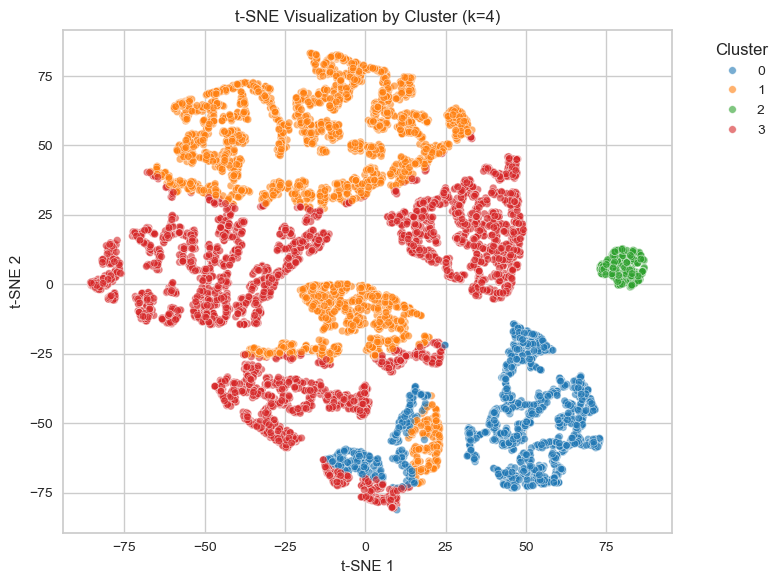

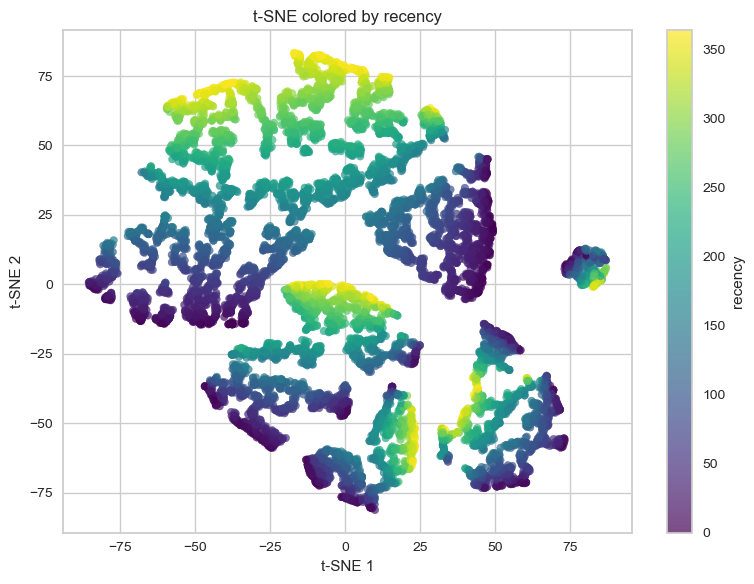

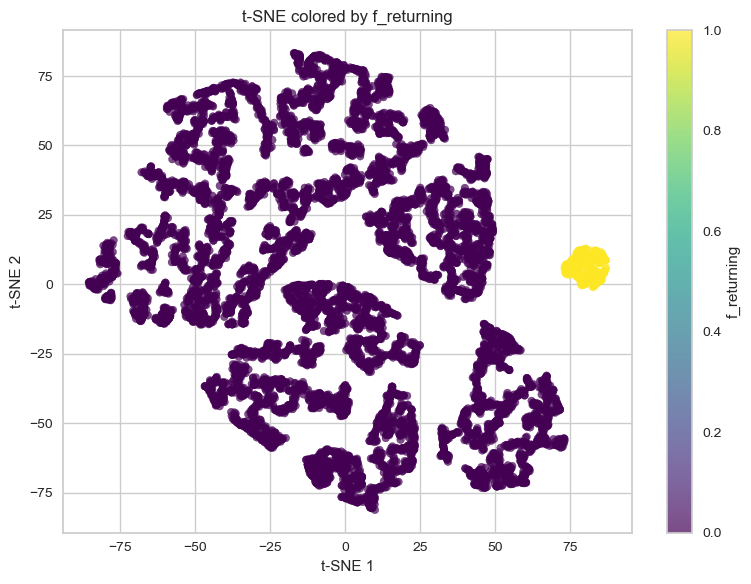

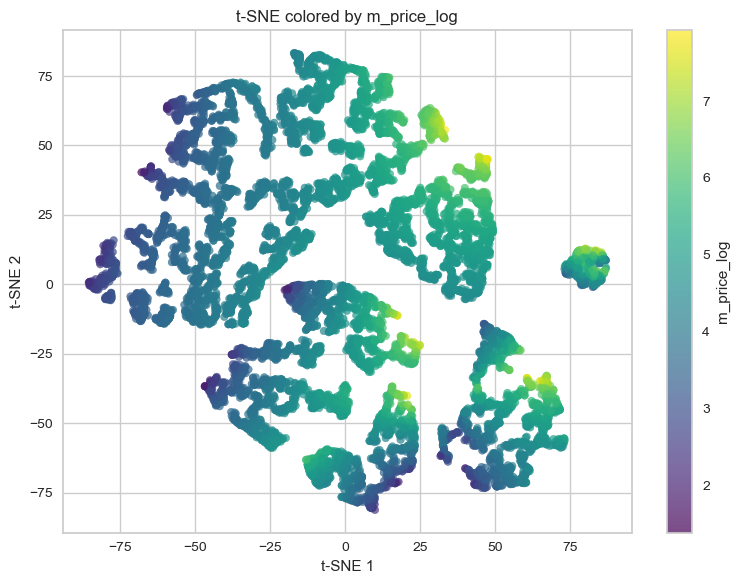

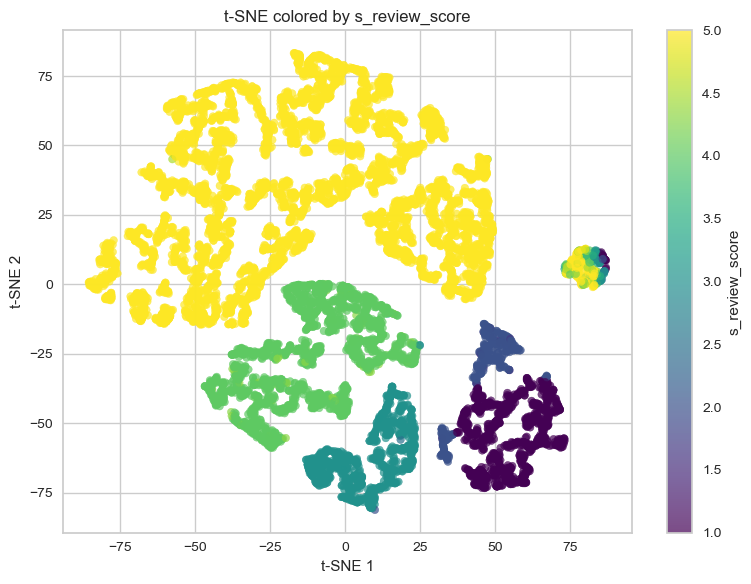

In [20]:
# 3) t-SNE visualization
df_sub = visualise_clusters(
    df,
    features=['recency','f_returning','m_price_log', 's_review_score'],
    scaler=scaler,
    km=km_model,
    subsample_size=10000,
    tsne_perplexity=40,
    save_fig=True,
    fig_dir="./plots/tests/rfm_review"
)

### Model 2: RFM + delivery diff

Clustering metrics:
    silhouette  calinski_harabasz  davies_bouldin
k                                               
2        0.67           22162.57            0.47
3        0.27           24835.93            1.15
4        0.26           25580.40            1.09
5        0.29           27623.88            0.97
6        0.26           26765.84            1.02
7        0.26           25625.64            1.06
8        0.25           24774.36            1.06


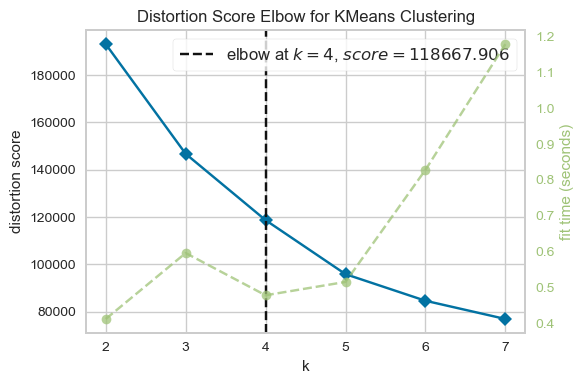

In [22]:
# 1) Evaluate cluster matrics
scaler, metrics, best_k = evaluate_k_metrics(
    df,
    features=['recency','f_returning','m_price_log', 's_delivery_diff'],
    k_min=2, k_max=8,
    save_fig=False,
    fig_path="./plots/tests/rfm_delivery/elbow_silhouette_rfm_delivery.png"
)

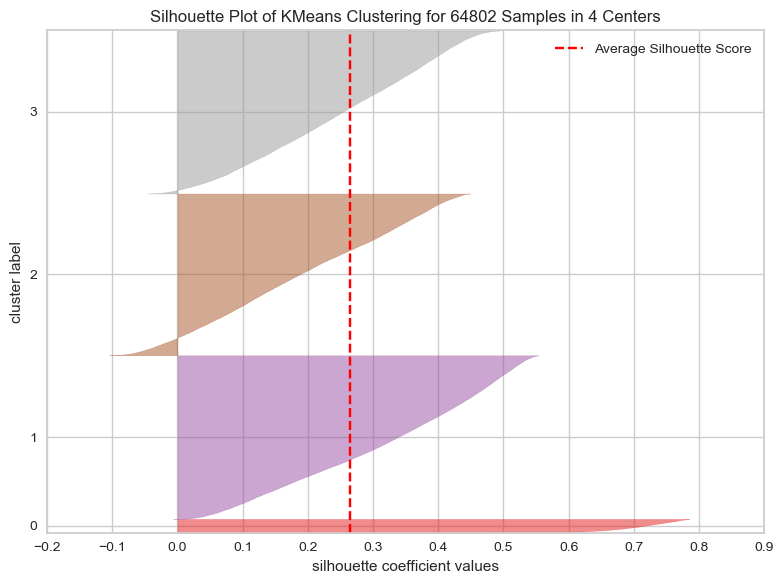

Cluster counts:
          count
cluster       
0         1766
1        21115
2        20879
3        21042
Cluster profiles:



,recency,f_returning,m_price,s_delivery_diff
cluster,,,,
0,142.50,1.00,253.94,-10.88
1,267.80,0.00,102.74,-12.37
2,98.34,0.00,55.21,-5.05
3,102.69,0.00,251.90,-13.07


In [23]:
# 2) Fit at chosen k, get profiles
km_model, cluster_profiles = fit_best_k(
    df,
    features=['recency','f_returning','m_price_log', 's_delivery_diff'],
    scaler=scaler,
    k=best_k,
    features_interpret=['recency','f_returning','m_price', 's_delivery_diff'],
    save_fig=False,
    fig_path="./plots/tests/rfm_delivery/silhouette_kmeans_rfm_delivery.png"
)

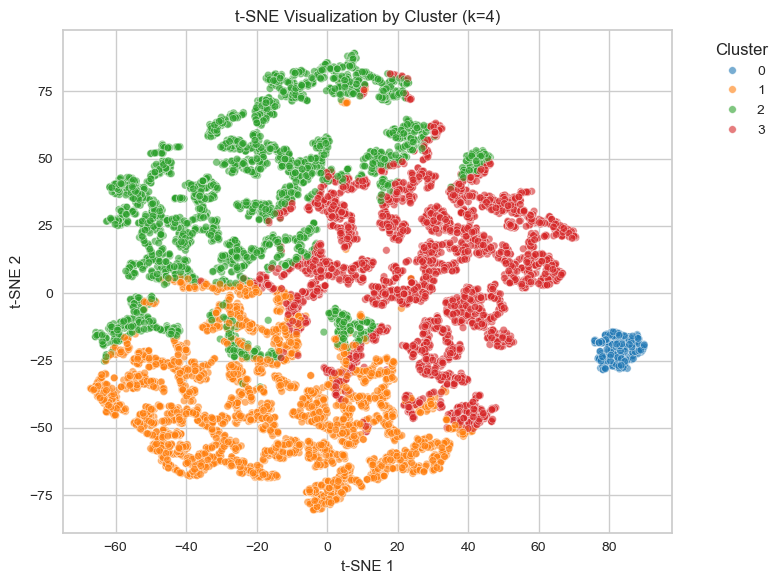

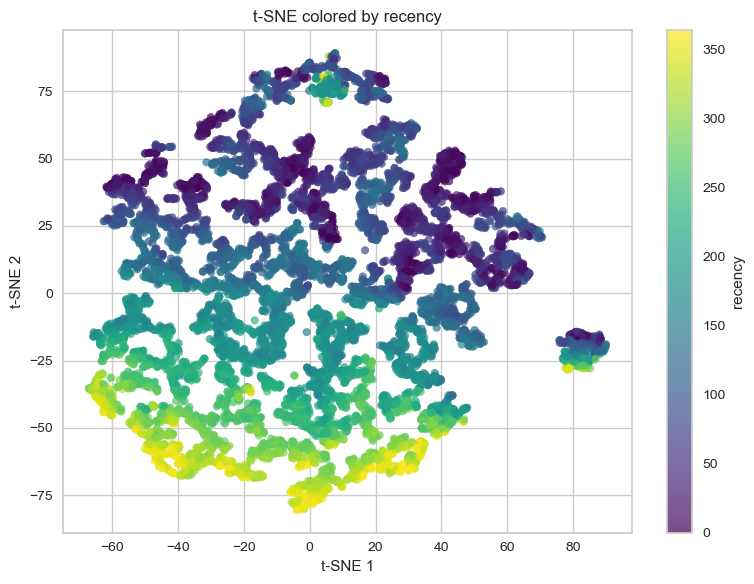

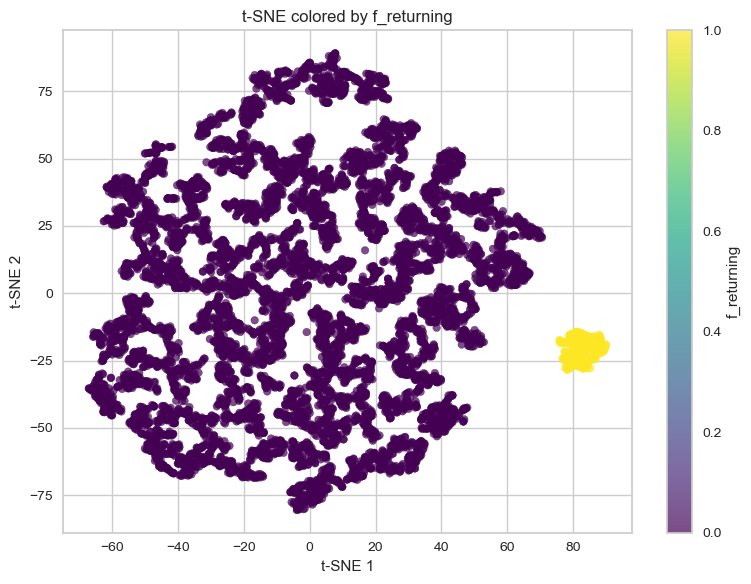

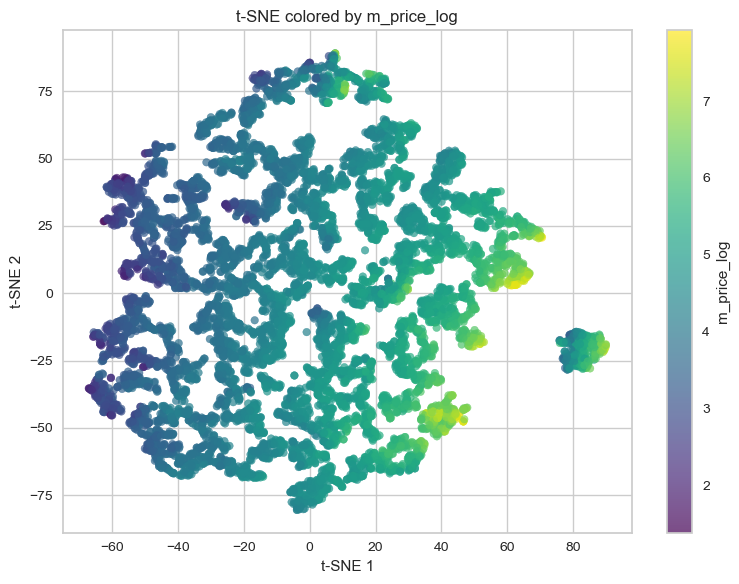

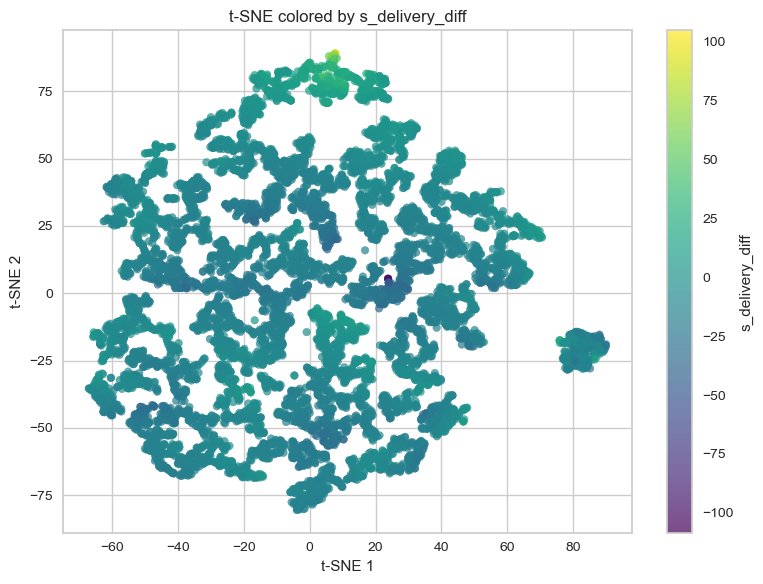

In [24]:
# 3) t-SNE visualization
df_sub = visualise_clusters(
    df,
    features=['recency','f_returning','m_price_log', 's_delivery_diff'],
    scaler=scaler,
    km=km_model,
    subsample_size=10000,
    tsne_perplexity=40,
    save_fig=False,
    fig_dir="./plots/tests/rfm_delivery"
)

### Model 3: RFM + purchasing power

Clustering metrics:
    silhouette  calinski_harabasz  davies_bouldin
k                                               
2        0.66           22162.28            0.52
3        0.37           32252.79            0.99
4        0.34           31785.43            0.94
5        0.35           33656.76            1.00
6        0.35           35269.56            0.91
7        0.36           38164.44            0.83
8        0.35           37923.99            0.85


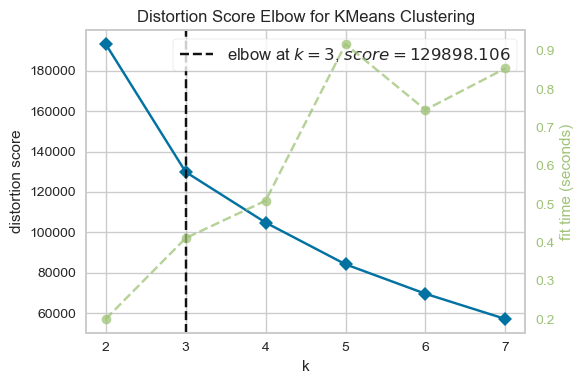

In [26]:
# 1) Evaluate cluster matrics
scaler, metrics, best_k = evaluate_k_metrics(
    df,
    features=['recency','f_returning','m_price_log', 'm_purchasing_power'],
    k_min=2, k_max=8,
    save_fig=False,
    fig_path="./plots/tests/rfm_delivery/elbow_silhouette_rfm_pp.png"
)

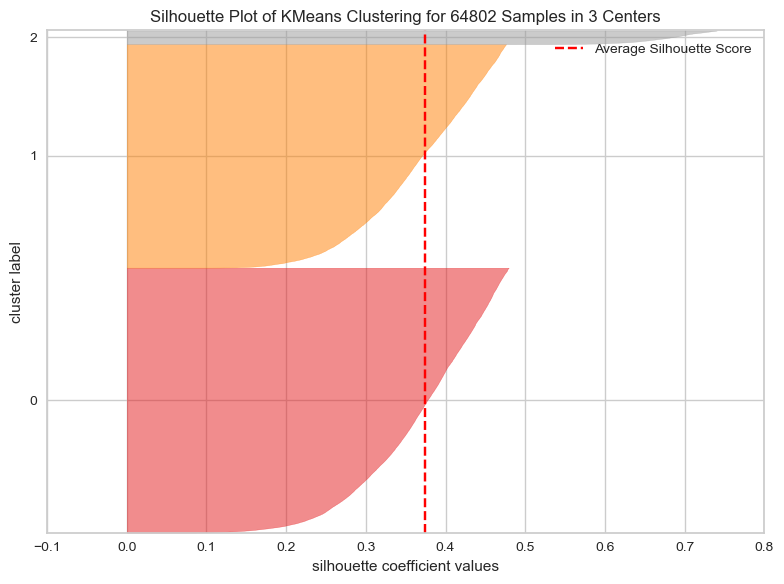

Cluster counts:
          count
cluster       
0        34201
1        28835
2         1766
Cluster profiles:



,recency,f_returning,m_price,m_purchasing_power
cluster,,,,
0,154.21,0.00,129.90,1.00
1,159.33,0.00,144.95,0.00
2,142.50,1.00,253.94,0.58


In [27]:
# 2) Fit at chosen k, get profiles
km_model, cluster_profiles = fit_best_k(
    df,
    features=['recency','f_returning','m_price_log', 'm_purchasing_power'],
    scaler=scaler,
    k=best_k,
    features_interpret=['recency','f_returning','m_price', 'm_purchasing_power'],
    save_fig=False,
    fig_path="./plots/tests/rfm_purchasing/silhouette_kmeans_rfm_pp.png"
)

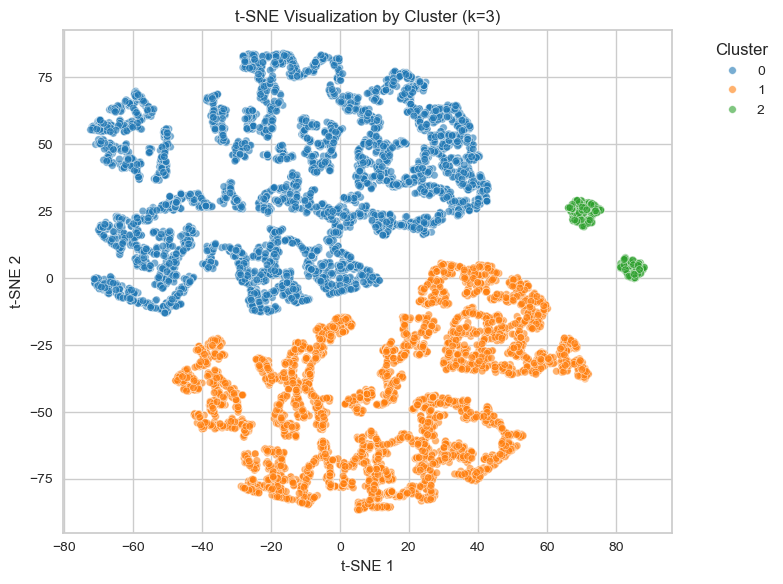

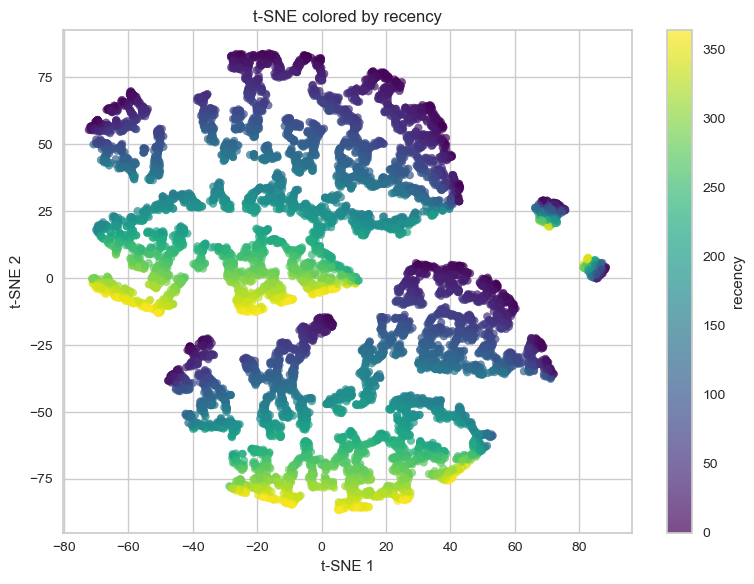

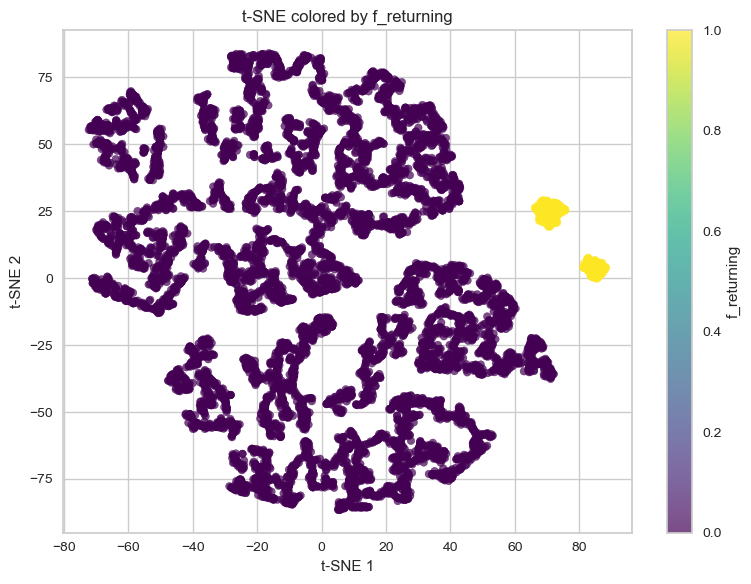

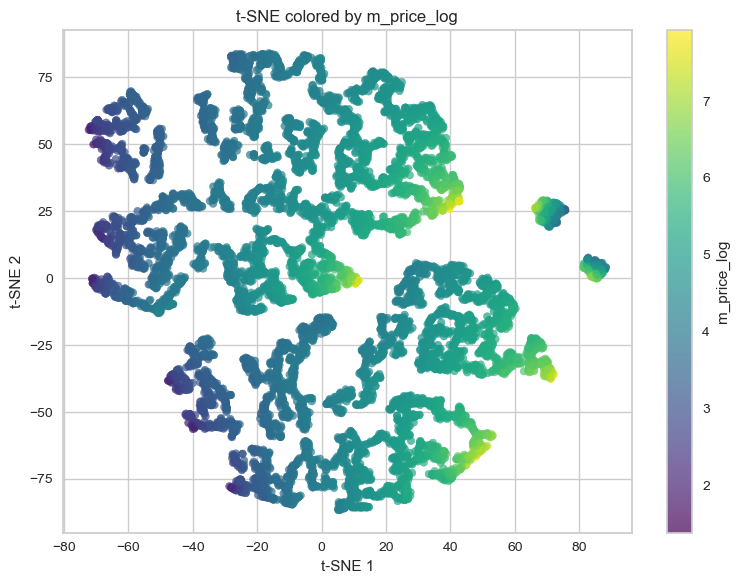

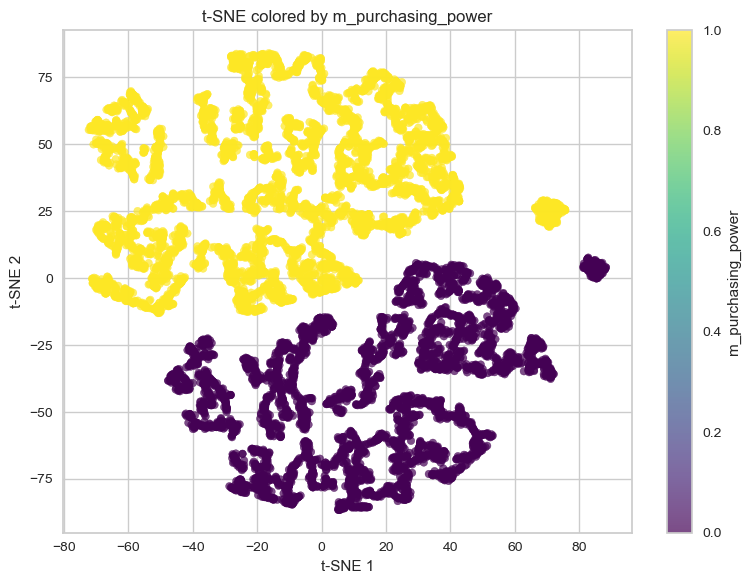

In [28]:
# 3) t-SNE visualization
df_sub = visualise_clusters(
    df,
    features=['recency','f_returning','m_price_log', 'm_purchasing_power'],
    scaler=scaler,
    km=km_model,
    subsample_size=10000,
    tsne_perplexity=40,
    save_fig=False,
    fig_dir="./plots/tests/rfm_purchasing"
)

### Model 4: RFM + state spending

Clustering metrics:
    silhouette  calinski_harabasz  davies_bouldin
k                                               
2        0.67           22160.69            0.48
3        0.28           24611.41            1.17
4        0.31           29993.22            1.00
5        0.30           33816.83            0.91
6        0.28           32888.69            0.99
7        0.27           31195.54            1.05
8        0.27           30041.91            1.00


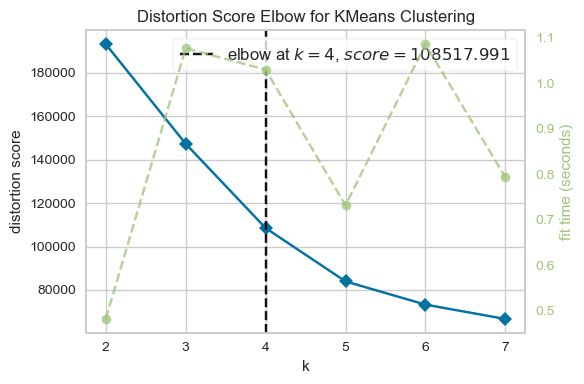

In [30]:
# 1) Evaluate cluster matrics
scaler, metrics, best_k = evaluate_k_metrics(
    df,
    features=['recency','f_returning','m_price_log', 'state_spending'],
    k_min=2, k_max=8,
    save_fig=False,
    fig_path="./plots/tests/rfm_state/elbow_silhouette_rfm_state.png"
)

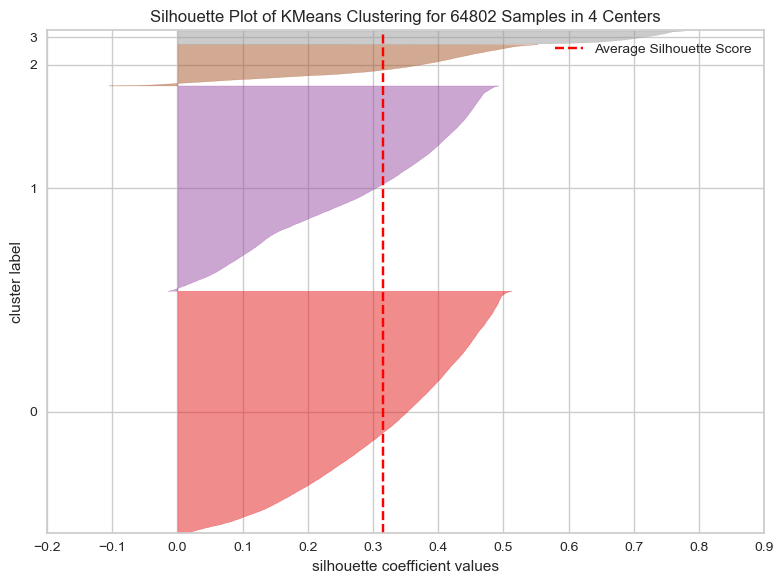

Cluster counts:
          count
cluster       
0        31231
1        26492
2         5313
3         1766
Cluster profiles:



,recency,f_returning,m_price,state_spending
cluster,,,,
0,78.12,0.00,132.83,136.14
1,248.05,0.00,132.52,136.75
2,161.35,0.00,181.32,178.89
3,142.50,1.00,253.94,139.22


In [31]:
# 2) Fit at chosen k, get profiles
km_model, cluster_profiles = fit_best_k(
    df,
    features=['recency','f_returning','m_price_log', 'state_spending'],
    scaler=scaler,
    k=best_k,
    features_interpret=['recency','f_returning','m_price', 'state_spending'],
    save_fig=False,
    fig_path="./plots/tests/rfm_state/silhouette_kmeans_rfm_state.png"
)

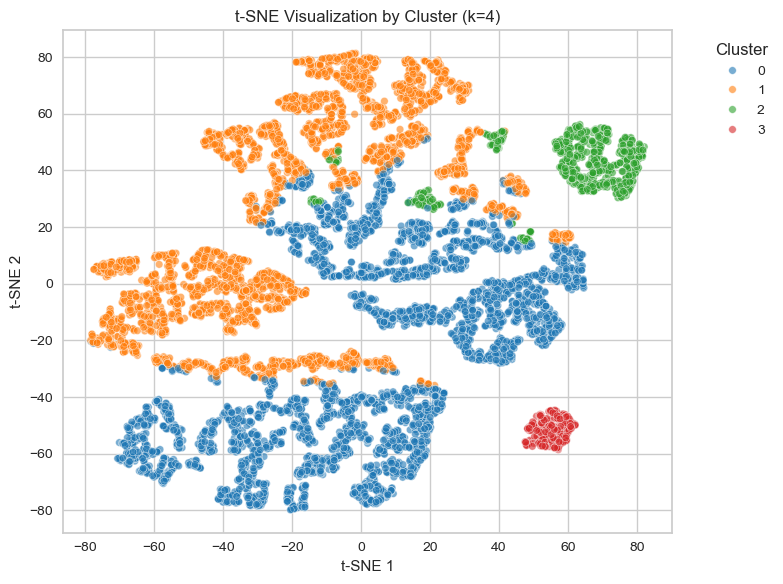

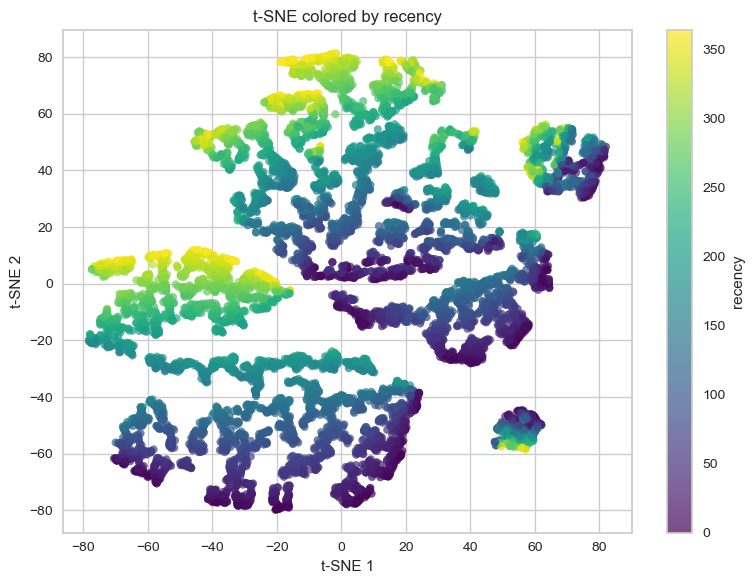

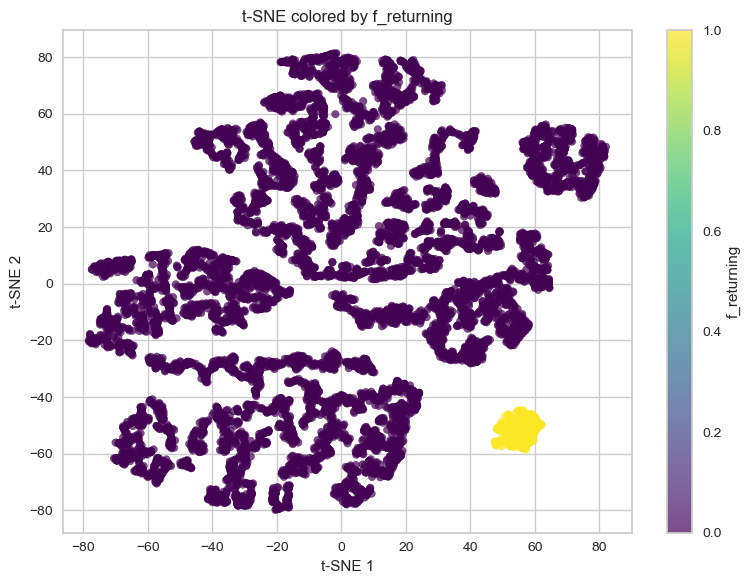

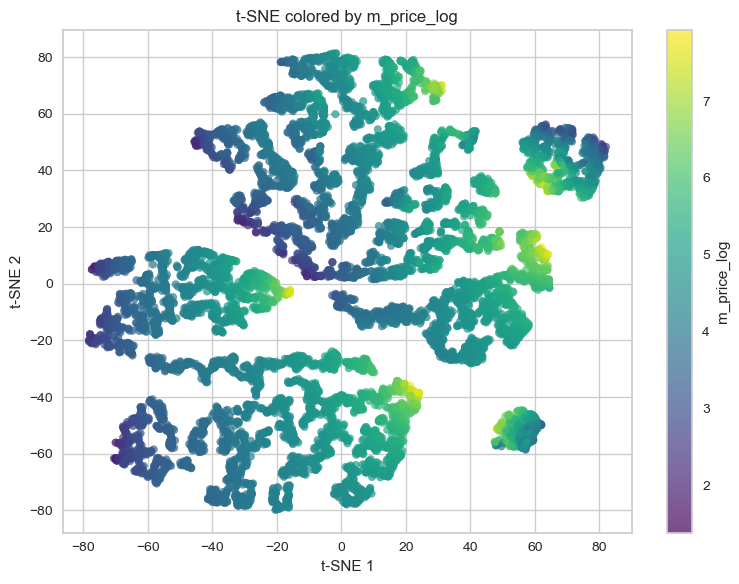

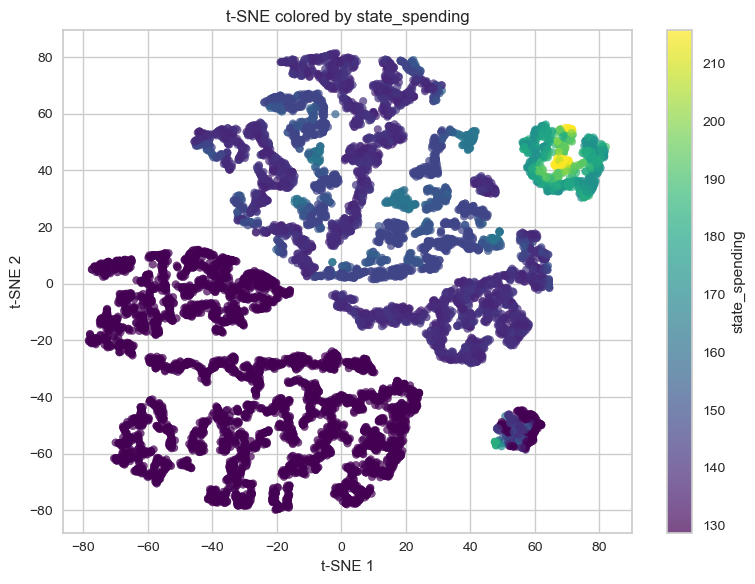

In [32]:
# 3) t-SNE visualization
df_sub = visualise_clusters(
    df,
    features=['recency','f_returning','m_price_log', 'state_spending'],
    scaler=scaler,
    km=km_model,
    subsample_size=10000,
    tsne_perplexity=40,
    save_fig=False,
    fig_dir="./plots/tests/rfm_state"
)

### Model 5: RFM + installments

Clustering metrics:
    silhouette  calinski_harabasz  davies_bouldin
k                                               
2        0.67           22172.66            0.49
3        0.37           29887.01            0.99
4        0.33           35549.36            0.96
5        0.31           36968.14            0.91
6        0.29           35140.10            1.00
7        0.29           33705.85            1.06
8        0.29           32116.00            1.02


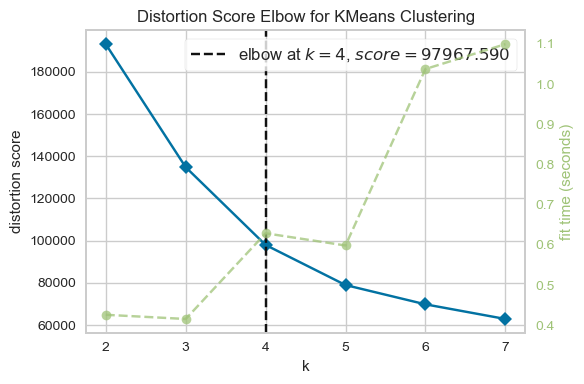

In [34]:
# 1) Evaluate cluster matrics
scaler, metrics, best_k = evaluate_k_metrics(
    df,
    features=['recency','f_returning','m_price_log', 'm_total_installments'],
    k_min=2, k_max=8,
    save_fig=False,
    fig_path="./plots/tests/rfm_installments/elbow_silhouette_rfm_inst.png"
)

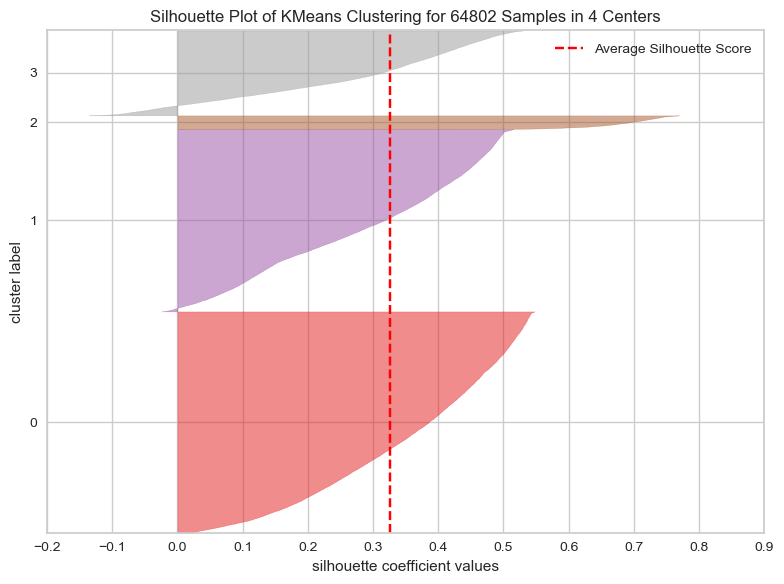

Cluster counts:
          count
cluster       
0        28557
1        23527
2         1766
3        10952
Cluster profiles:



,recency,f_returning,m_price,m_total_installments
cluster,,,,
0,78.70,0.00,98.24,1.85
1,250.04,0.00,97.52,2.04
2,142.50,1.00,253.94,3.32
3,158.72,0.00,321.65,7.81


In [35]:
# 2) Fit at chosen k, get profiles
km_model, cluster_profiles = fit_best_k(
    df,
    features=['recency','f_returning','m_price_log', 'm_total_installments'],
    scaler=scaler,
    k=best_k,
    features_interpret=['recency','f_returning','m_price', 'm_total_installments'],
    save_fig=False,
    fig_path="./plots/tests/rfm_installments/silhouette_kmeans_rfm_inst.png"
)

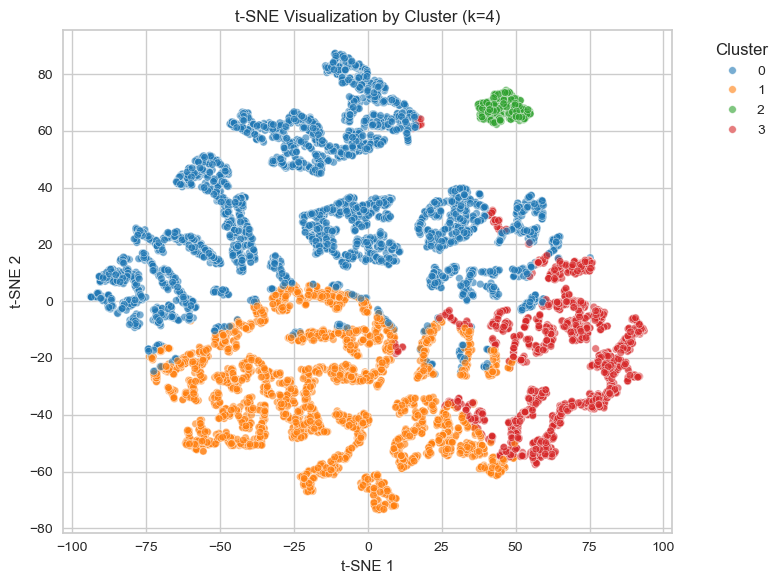

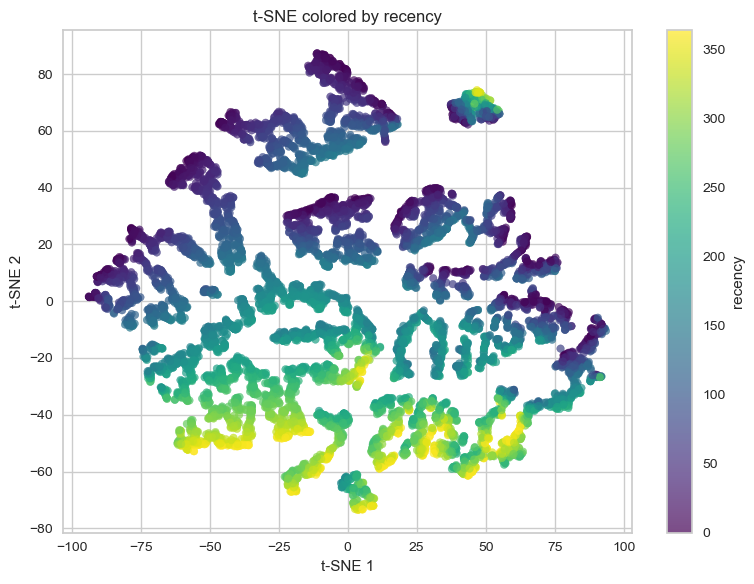

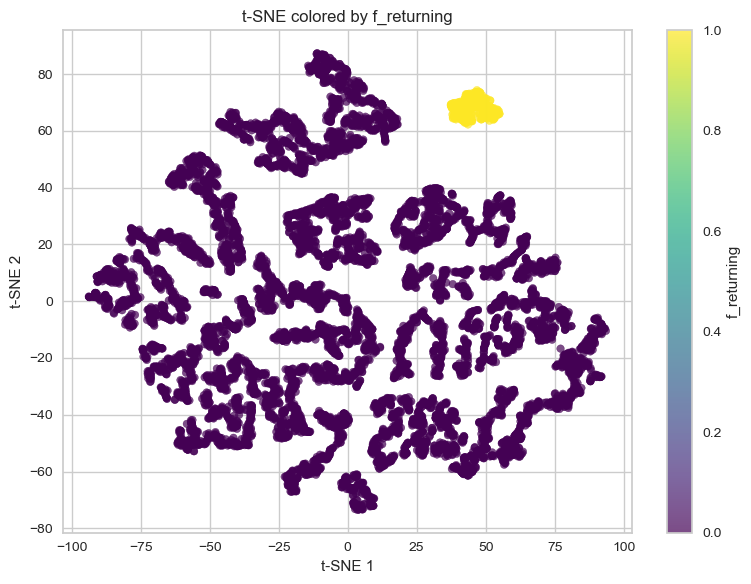

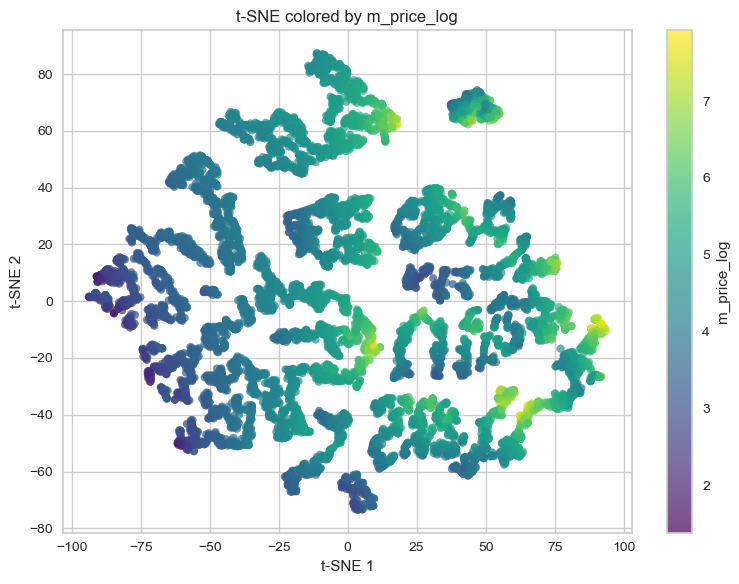

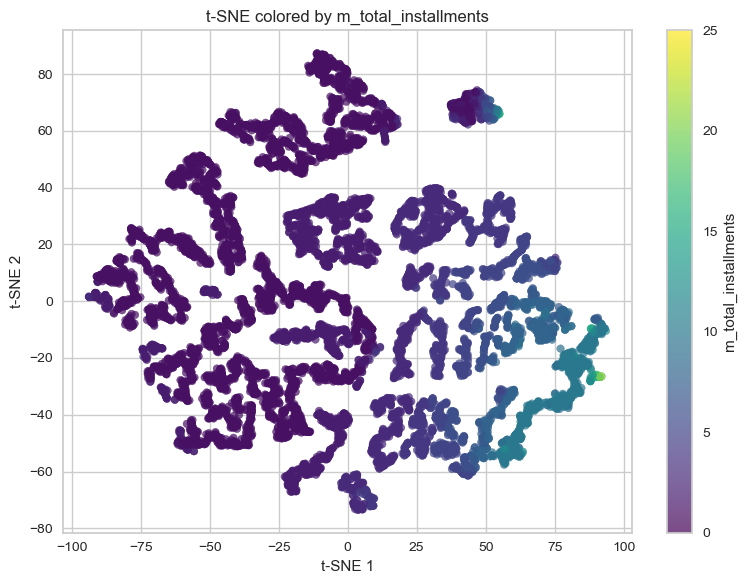

In [36]:
# 3) t-SNE visualization
df_sub = visualise_clusters(
    df,
    features=['recency','f_returning','m_price_log', 'm_total_installments'],
    scaler=scaler,
    km=km_model,
    subsample_size=10000,
    tsne_perplexity=40,
    save_fig=False,
    fig_dir="./plots/tests/rfm_installments"
)

### Model 6: RFM + Product Popularity

Clustering metrics:
    silhouette  calinski_harabasz  davies_bouldin
k                                               
2        0.66           22172.36            0.51
3        0.29           26360.98            1.18
4        0.29           27851.61            1.06
5        0.29           29396.54            0.97
6        0.30           29922.99            0.97
7        0.28           29387.88            0.99
8        0.29           28888.09            1.01


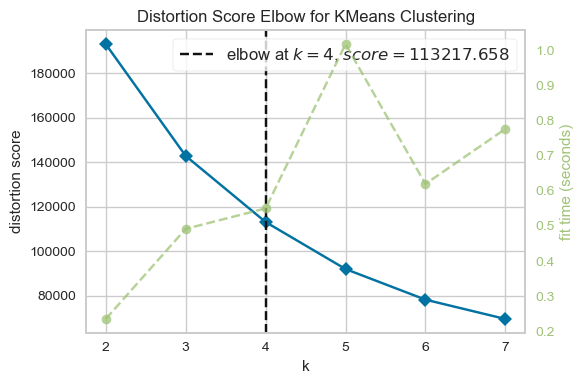

In [38]:
# 1) Evaluate cluster matrics
scaler, metrics, best_k = evaluate_k_metrics(
    df,
    features=['recency','f_returning','m_price_log', 'product_score'],
    k_min=2, k_max=8,
    save_fig=False,
    fig_path="./plots/tests/rfm_popularity/elbow_silhouette_rfm_pop.png"
)

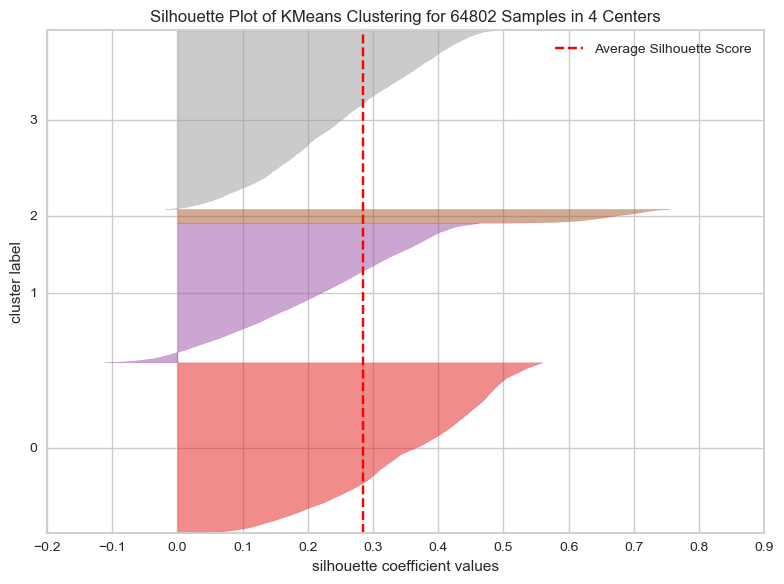

Cluster counts:
          count
cluster       
0        21981
1        18020
2         1766
3        23035
Cluster profiles:



,recency,f_returning,m_price,product_score
cluster,,,,
0,99.99,0.00,139.53,4.60
1,282.63,0.00,127.23,3.42
2,142.50,1.00,253.94,3.12
3,111.90,0.00,141.64,1.99


In [39]:
# 2) Fit at chosen k, get profiles
km_model, cluster_profiles = fit_best_k(
    df,
    features=['recency','f_returning','m_price_log', 'product_score'],
    scaler=scaler,
    k=best_k,
    features_interpret=['recency','f_returning','m_price', 'product_score'],
    save_fig=False,
    fig_path="./plots/tests/rfm_popularity/silhouette_kmeans_rfm_pop.png"
)

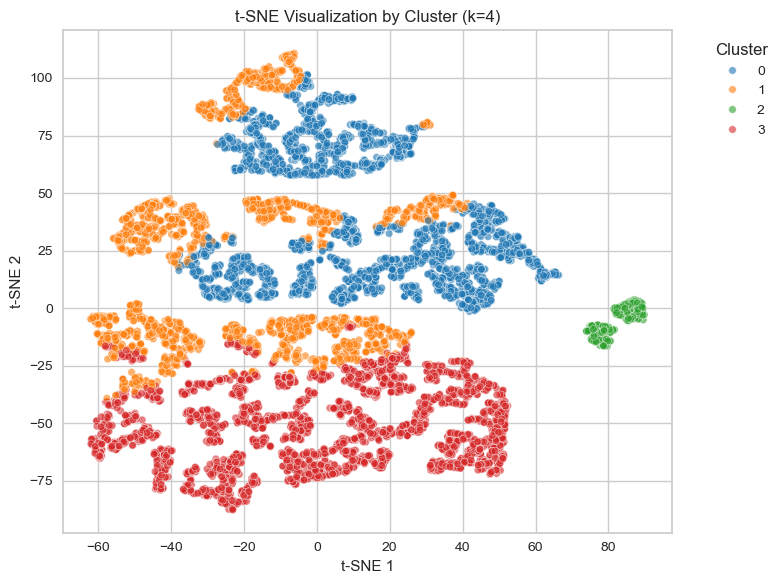

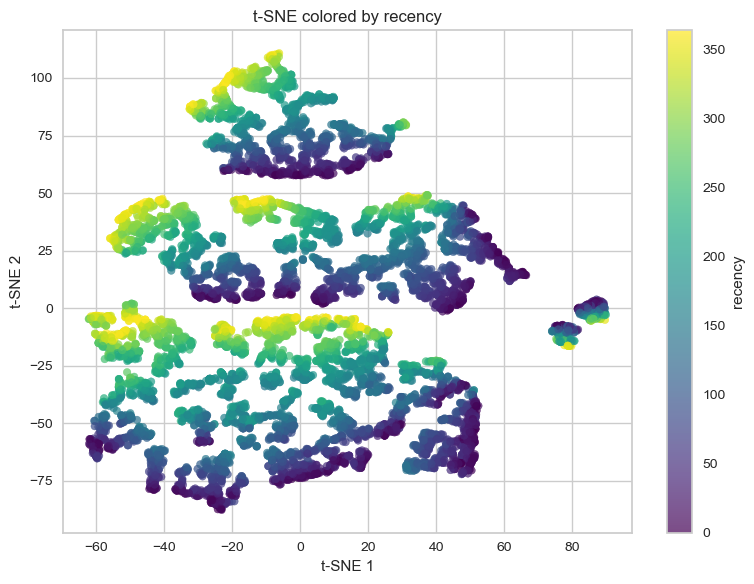

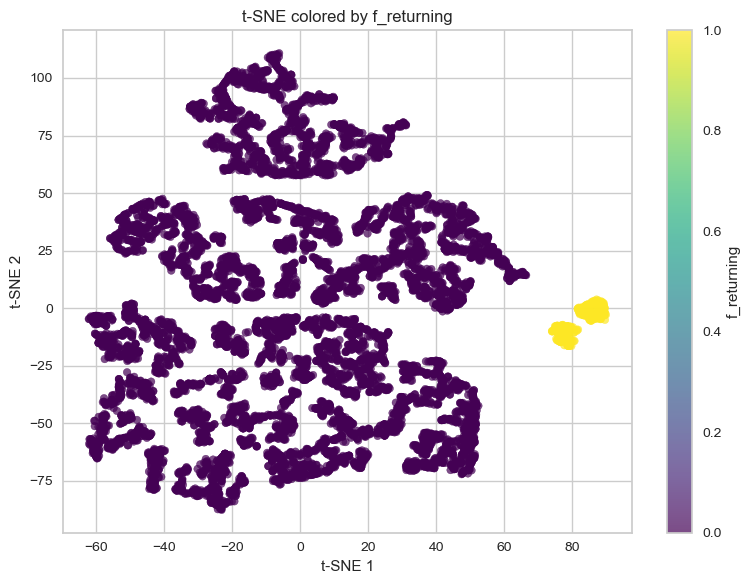

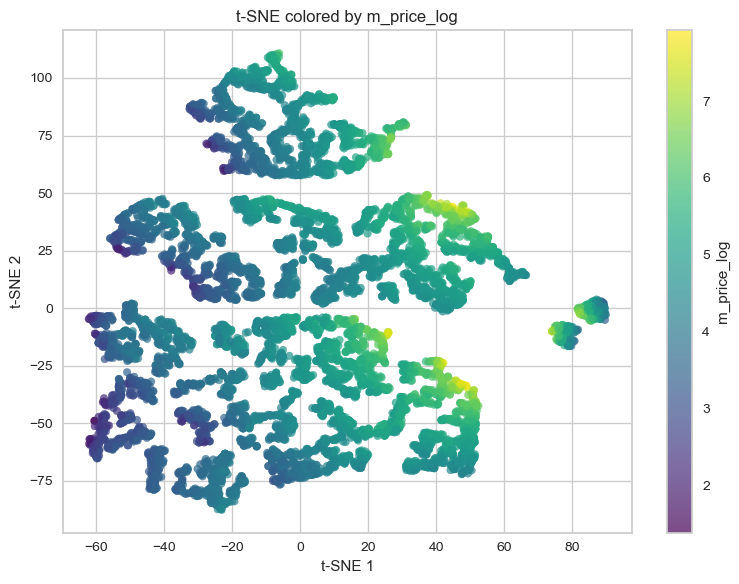

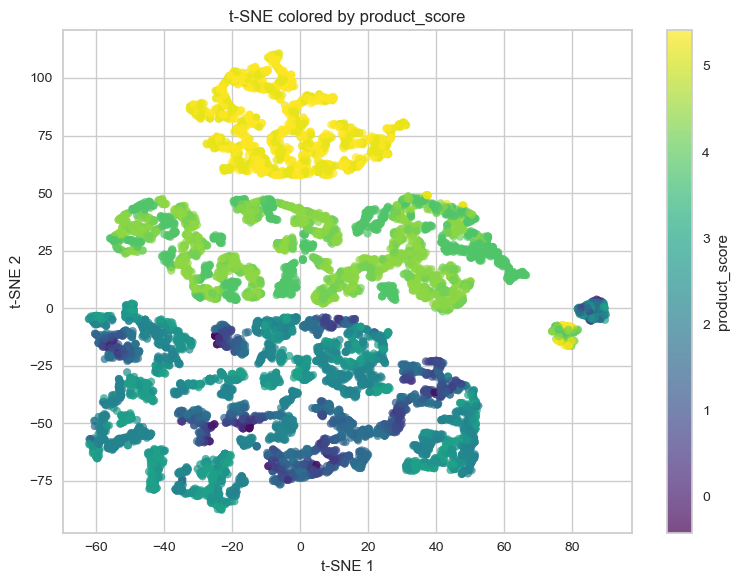

In [40]:
# 3) t-SNE visualization
df_sub = visualise_clusters(
    df,
    features=['recency','f_returning','m_price_log', 'product_score'],
    scaler=scaler,
    km=km_model,
    subsample_size=10000,
    tsne_perplexity=40,
    save_fig=False,
    fig_dir="./plots/tests/rfm_popularity"
)

## 4. Other Clustering Approaches

### DBSCAN

In [43]:
features = ['recency', 'f_returning', 'm_price_log']

X = df[features].values
scaler = StandardScaler().fit(X)
X_scaled = scaler.transform(X)

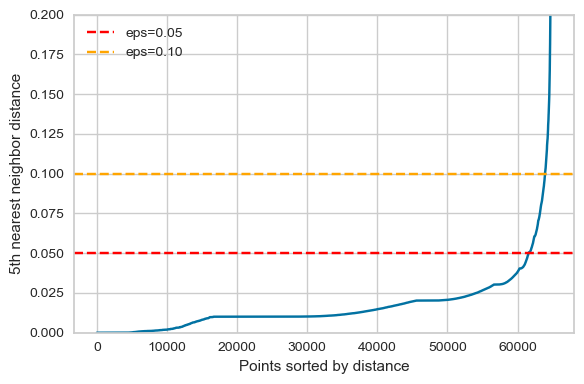

In [44]:
# 5th-NN distance plot for eps guidance
nbrs = NearestNeighbors(n_neighbors=5).fit(X_scaled)
dists, _ = nbrs.kneighbors(X_scaled)
dists = np.sort(dists[:, 4])
plt.figure(figsize=(6,4))
plt.plot(dists)
plt.ylabel("5th nearest neighbor distance")
plt.xlabel("Points sorted by distance")
plt.ylim(0, 0.2)
plt.axhline(0.05, linestyle='--', color='red', label='eps=0.05')
plt.axhline(0.10, linestyle='--', color='orange', label='eps=0.10')
plt.legend()
plt.tight_layout()
plt.savefig(f"./plots/tests/dbscan/5th_nearest_neighbor_distance.png")
plt.show()

In [45]:
# DBSCAN clustering
eps_values        = [0.05, 0.1]
min_samples_vals  = [10, 100]

results = []
for eps in eps_values:
    for ms in min_samples_vals:
        db = DBSCAN(eps=eps, min_samples=ms).fit(X_scaled)
        labels = db.labels_
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        n_noise    = (labels == -1).sum()
        sil = silhouette_score(X_scaled[labels != -1], labels[labels != -1])

        results.append({
            'eps':            eps,
            'min_samples':    ms,
            'n_clusters':     n_clusters,
            'n_noise':        n_noise,
            'silhouette':     sil
        })

df_results = pd.DataFrame(results)
df_results.sort_values(['silhouette','n_clusters'], ascending=[False,True])

,eps,min_samples,n_clusters,n_noise,silhouette
1,0.05,100,41,53821,0.46
2,0.10,10,27,1400,0.31
0,0.05,10,69,4383,-0.25
3,0.10,100,8,11065,-0.33


In [108]:
# DBSCAN clustering
db = DBSCAN(eps=0.1, min_samples=100).fit(X_scaled)
labels_db = db.labels_
df['cluster_db'] = labels_db

# Observations per cluster
unique, counts = np.unique(labels_db, return_counts=True)
print(dict(zip(unique, counts)))

{-1: 11065, 0: 52795, 1: 262, 2: 130, 3: 119, 4: 158, 5: 163, 6: 101, 7: 9}


In [47]:
idx = np.random.RandomState(42).choice(len(df), size=min(10000, len(df)), replace=False)
df_sub = df.iloc[idx].copy()
    
# t-SNE embedding
X_sub = scaler.transform(df_sub[features].values)
tsne = TSNE(n_components=2, perplexity=40, init='pca', random_state=42)
Y = tsne.fit_transform(X_sub)
df_sub['tsne1'], df_sub['tsne2'] = Y[:,0], Y[:,1]

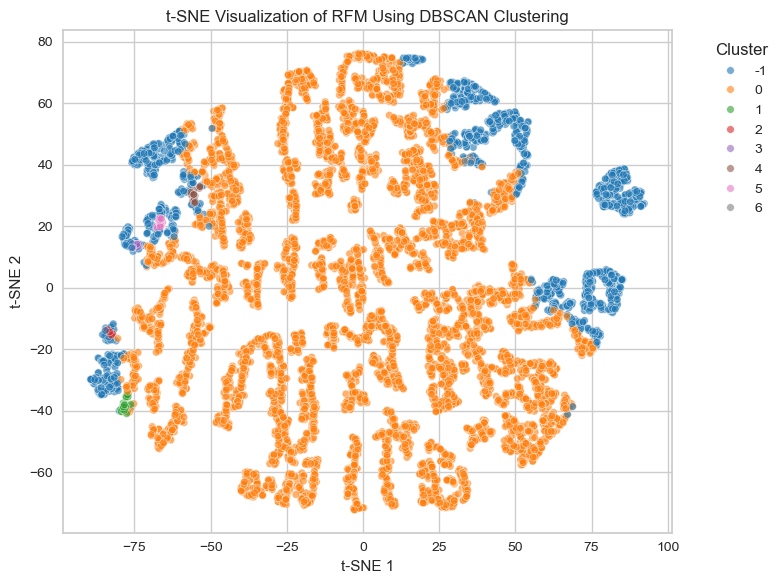

In [48]:
# Plot clusters
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_sub, x='tsne1', y='tsne2',
                hue='cluster_db', palette='tab10',
                s=30, alpha=0.6)
plt.title(f"t-SNE Visualization of RFM Using DBSCAN Clustering")
plt.xlabel("t-SNE 1"); plt.ylabel("t-SNE 2")
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f"./plots/tests/dbscan/tsne_clusters_dbscan_rmf.png")
plt.show()

DBSCAN only grabs two tiny pockets of high density and throws essentially everything else into “noise.” This behavior makes it unsuitable for a full‐spectrum marketing segmentation.

### Agglomerative clustering

Marketing specialists can use hierarchical clustering to draw a hierarchy between different types of customers based on their purchasing habits for better marketing strategies and product recommendations.

Compare dendrograms linkages to pick a sensible k for Agglomerative clustering:

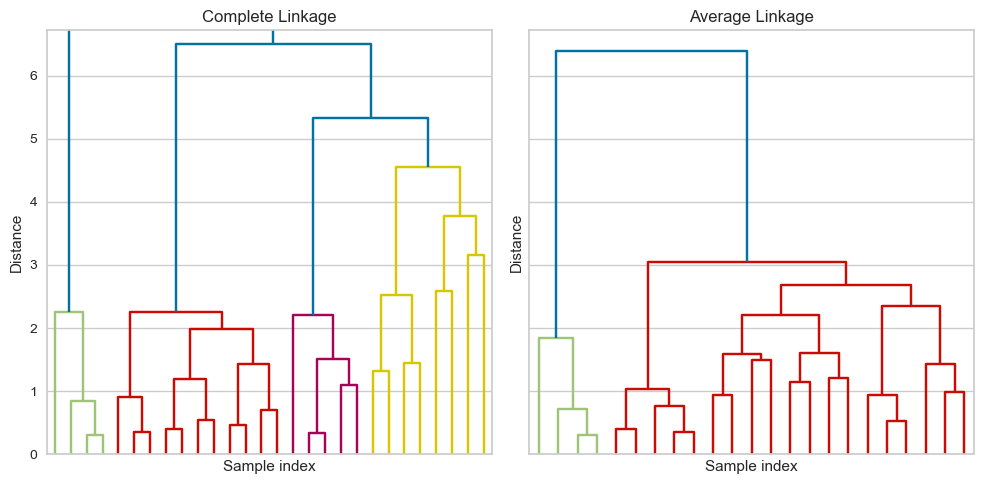

In [52]:
# Visualise linkages
np.random.seed(42)
idx = np.random.choice(len(X_scaled), size=300, replace=False)
X_sub = X_scaled[idx]

Z_complete = linkage(X_sub, method='complete', metric='euclidean')
Z_average  = linkage(X_sub, method='average' , metric='euclidean')

fig, axes = plt.subplots(1, 2, figsize=(10, 5), sharey=True)
for Z, title, ax in zip(
    [Z_complete, Z_average],
    ['Complete Linkage', 'Average Linkage'],
    axes
):
    dendrogram(
        Z,
        no_labels=True,
        color_threshold=None,
        ax=ax,
        truncate_mode='level',
        p=5
    )
    ax.set_title(title)
    ax.set_xlabel('Sample index')
    ax.set_ylabel('Distance')

plt.tight_layout()
plt.show()

In [53]:
# Evaluate cluster matrics
rng = np.random.RandomState(42)
idx = rng.choice(len(X_scaled), size=10000, replace=False)
X_sub = X_scaled[idx]

# Compare between linkages
for linkage in ['complete', 'average']:
    print(f"\nLinkage = '{linkage}'")
    for k in range(3, 7):
        agg = AgglomerativeClustering(n_clusters=k, linkage=linkage)
        labels = agg.fit_predict(X_sub)
        sil = silhouette_score(X_sub, labels)
        print(f"  k = {k:<2d} → silhouette = {sil:.3f}")


Linkage = 'complete'
  k = 3  → silhouette = 0.283
  k = 4  → silhouette = 0.267
  k = 5  → silhouette = 0.255
  k = 6  → silhouette = 0.279

Linkage = 'average'
  k = 3  → silhouette = 0.338
  k = 4  → silhouette = 0.197
  k = 5  → silhouette = 0.263
  k = 6  → silhouette = 0.253


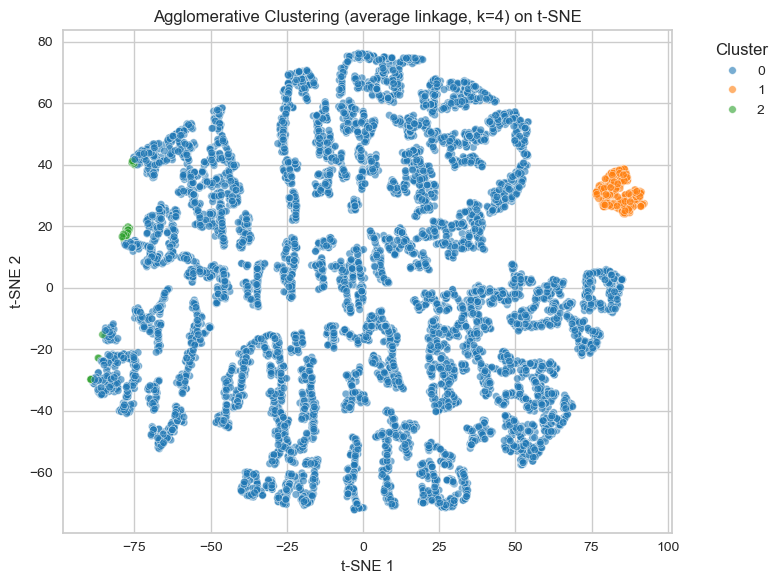

In [54]:
# t-SNE visualization
rng = np.random.RandomState(42)
idx = rng.choice(len(X_scaled), size=10000, replace=False)
X_sub = X_scaled[idx]
df_sub = pd.DataFrame(X_sub, columns=features)

tsne = TSNE(n_components=2, perplexity=40, init='pca', random_state=42)
Y = tsne.fit_transform(X_sub)
df_sub['tsne1'], df_sub['tsne2'] = Y[:, 0], Y[:, 1]

agg = AgglomerativeClustering(n_clusters=3, linkage='average')
df_sub['cluster_avg'] = agg.fit_predict(X_sub).astype(str)

plt.figure(figsize=(8,6))
sns.scatterplot(
    data=df_sub,
    x='tsne1', y='tsne2',
    hue='cluster_avg',
    palette='tab10',
    s=30, alpha=0.6
)
plt.title("Agglomerative Clustering (average linkage, k=4) on t-SNE")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.legend(title='Cluster', bbox_to_anchor=(1.05,1), loc='upper left')
plt.tight_layout()
plt.savefig("./plots/tests/agglo/agglo_clustering_rfm.png")
plt.show()

In [55]:
df_sub['cluster_avg'].value_counts(normalize=True)

cluster_avg
0   0.97
1   0.03
2   0.00
Name: proportion, dtype: float64

Limitations of hierarchal clustering:
1. Scalability: Here we look at 10 000 points, however anything about 20 000 significantly slows down the processing time.
2. Sensitive to noise and outliers: Isolated observations can end up constructing a tree or single linkage.
3. Non-incremental: When you add new clinets, you must reconstruct the entire tree.